# This is my main topic

In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pylab as plt
import pickle
import scipy
from scipy import linalg
import tensorflow as tf
import sklearn
import math
from sklearn.preprocessing import StandardScaler

/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


# Constants

In [2]:
movie_path = "/Users/rana/Desktop/Broad/D2_FOV3_W1_at145930.bin"
num_frames = 7499
frame_height = 180
frame_width = 512
sub_frame_size = 80

# Load Movie

In [3]:
# load movie and reshape it
with open(movie_path, mode='rb') as f:
    raw_movie = np.fromfile(f, dtype='uint16')
reshaped_movie = raw_movie.reshape((num_frames, frame_height, frame_width))

# Flattened 2D movie 
#### (7499 * 92160) from (7499 * 180 * 512)

In [4]:
#Flattening reshaped movie
flattened_2D_movie = reshaped_movie.reshape(num_frames, frame_height*frame_width)
print(flattened_2D_movie.shape)


(7499, 92160)


# Plot a frame for Testing

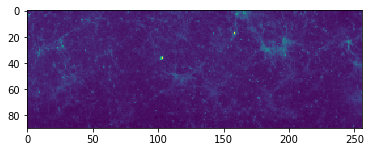

In [5]:
# plot one frame of the movie for testing
frame_index = 4000
pixel_skip = 2
resized_movie = reshaped_movie[:, ::pixel_skip, ::pixel_skip]
plt.imshow(resized_movie[frame_index, :, :])

In [6]:
print(resized_movie.shape)
n_frames,pix_x, pix_y = resized_movie.shape
flat_pix = pix_x*pix_y
print(flat_pix)

(7499, 90, 256)
23040


In [7]:
rm = resized_movie.reshape(n_frames, pix_x*pix_y)
print(rm.shape)

(7499, 23040)


In [8]:
resized_movie_shape = resized_movie.shape
flattened_resized_movie = resized_movie.reshape(num_frames, resized_movie_shape[1] * resized_movie_shape[2])

In [9]:
print(flattened_resized_movie.shape)
#np.savetxt('flattened_resized_movie.txt', flattened_resized_movie)

(7499, 23040)


# Perform PCA

## Standardizing data ( 0 mean and 1 variance)

In [10]:
X_std = StandardScaler().fit_transform(flattened_resized_movie)
mean_vec = np.mean(X_std, axis=0)
print(X_std.shape) #(7499, flat_pix)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype uint16 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


(7499, 23040)


## Covariance Matrix

In [82]:
cov_mat = (X_std - mean_vec).T.dot((X_std - mean_vec)) / (X_std.shape[0]-1)
#np.cov(X_std.T) 
print('Covariance matrix shape: ', cov_mat.shape) #(3708, 3708)
print('Covariance matrix \n%s' %cov_mat)

Covariance matrix shape:  (10260, 10260)
Covariance matrix 
[[1.00013337 0.97864868 0.97902594 ... 0.12166637 0.11745163 0.11334319]
 [0.97864868 1.00013337 0.97885821 ... 0.13323671 0.14028077 0.1339555 ]
 [0.97902594 0.97885821 1.00013337 ... 0.12899135 0.13139398 0.1238354 ]
 ...
 [0.12166637 0.13323671 0.12899135 ... 1.00013337 0.59214045 0.58993104]
 [0.11745163 0.14028077 0.13139398 ... 0.59214045 1.00013337 0.63969065]
 [0.11334319 0.1339555  0.1238354  ... 0.58993104 0.63969065 1.00013337]]


## Eigendecomposition on the covariance matrix
Eigenvectors = Principal components

In [83]:
eig_vals, eig_vecs = np.linalg.eig(cov_mat)
print('Eigenvectors ' ,eig_vecs.shape)
print('Eigenvalues ' ,eig_vals.shape)

Eigenvectors  (10260, 10260)
Eigenvalues  (10260,)


## Corelation matrix
Eigendecomposition of the covariance matrix (if the input data was standardized) yields the same results as a eigendecomposition on the correlation matrix, since the correlation matrix can be understood as the normalized covariance matrix.

In [86]:
cor_mat1 = np.corrcoef(X_std.T)
eig_vals, eig_vecs = np.linalg.eig(cor_mat1)
#print('Eigenvectors \n%s' %eig_vecs)
#print('\nEigenvalues \n%s' %eig_vals)

### Testing
Eigenvectors only define the directions of the new axis, since they have all the same unit length 1, which can confirmed by the following two lines of code:

for ev in eig_vecs:
    np.testing.assert_array_almost_equal(1.0, np.linalg.norm(ev))
print('Everything ok!')

## Rank the eigenvalues from highest to lowest in order choose the top k eigenvectors.

In [88]:
# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort()
eig_pairs.reverse()

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print('Eigenvalues in descending order:')
eig_vals_sum=0.0
for i in eig_pairs:
    eig_vals_sum+=i[0]
    print(i[0])
    
print("eig_vals_sum: ", eig_vals_sum)

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

## Choose K principal components (eigenvectors) for our new feature subspace 

In [16]:
total = 0.0
threshold_val = 0.75
k_dim_subspace = 0
k_eig_vecs = []
k_eig_vals = []
for i in eig_pairs:
    total += i[0]
    if total/eig_vals_sum > threshold_val:
        break
    else: 
        k_dim_subspace += 1
        k_eig_vecs.append(i[1])
        k_eig_vals.append(i[0])
print('k_dim_subspace: ', k_dim_subspace)
print('k_eig_vecs length: ',len(k_eig_vecs) )
print('eig_pairs length: ', len(eig_pairs))
print('k_eig_vecs shape', np.asarray(k_eig_vecs).shape)
print('k_eig_vals length', len(k_eig_vals))

k_dim_subspace:  403
k_eig_vecs length:  403
eig_pairs length:  3708
k_eig_vecs shape (403, 3708)
k_eig_vals length 403


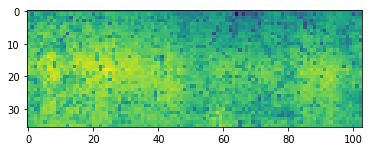

(36, 103)
(36, 103)


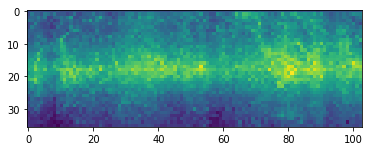

In [17]:
plt.imshow(k_eig_vecs[4].reshape(36, 103))
plt.show()
neuron = k_eig_vecs[4].reshape(36, 103)
print(neuron.shape)#(36, 103)

neuron_1 = k_eig_vecs[5].reshape(36, 103)
print(neuron_1.shape) #(36, 103)
plt.imshow(neuron_1)
plt.show()

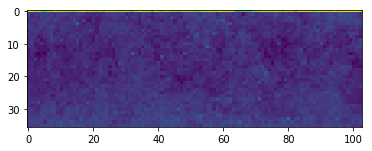

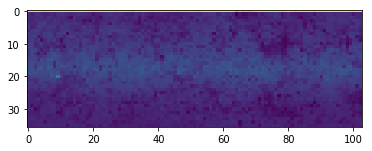

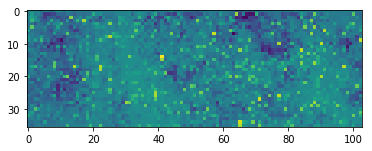

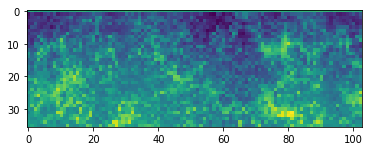

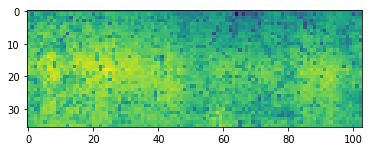

...

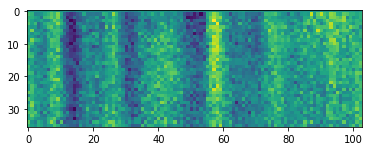

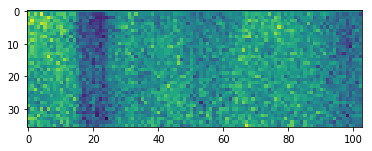

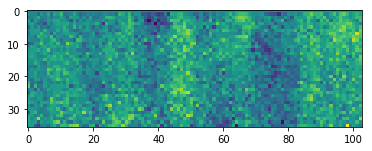

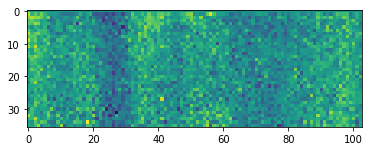

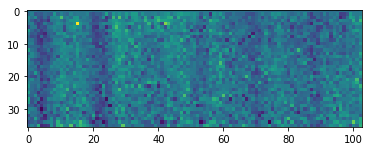

In [18]:
#Plotting 15 eigen vectors
for i in range(15):
    plt.imshow(k_eig_vecs[i].reshape(36, 103))
    plt.show()

# Explained variance 
The explained variance tells us how much information (variance) can be attributed to each of the principal components.

(3708,)


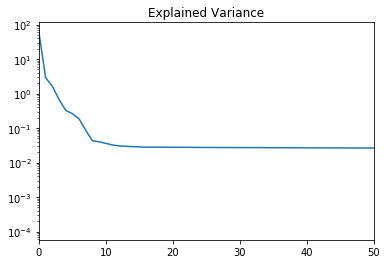

Text(0.5,1,'Cumulative Explained Variance')

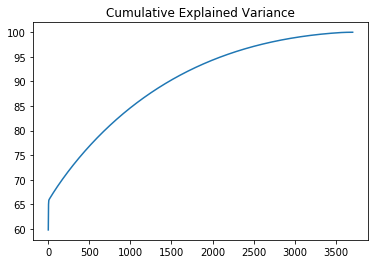

In [19]:
tot = np.sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]
#cumsum returns the cumulative sum of the elements along a given axis.
cum_var_exp = np.cumsum(var_exp)
print(cum_var_exp.shape) 
plt.plot(var_exp)
plt.title('Explained Variance')
plt.yscale('log')
plt.xlim((0,50))
plt.show()
plt.plot(cum_var_exp)
plt.title('Cumulative Explained Variance')

## Projection matrix


projection_matrix shape:  (403, 3708)
k eig vecs shape:  (403, 3708)


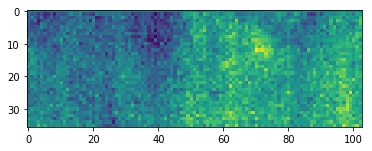

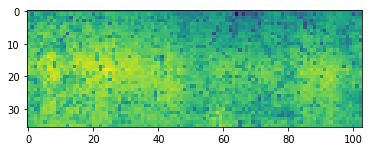

In [20]:
projection_matrix = np.asarray(k_eig_vecs).dot(cov_mat)

print('projection_matrix shape: ', projection_matrix.shape)
print('k eig vecs shape: ', np.asarray(k_eig_vecs).shape)
plt.imshow(k_eig_vecs[8].reshape(36, 103))
plt.show()
plt.imshow(projection_matrix[4].reshape(36, 103))

# Randomized PCA

In [21]:
A = X_std # 7499 * 3708 = m * n 

# Random Matrix R
Real n*k matrix G whose entries are i.i.d. Gaussian random variables of zero mean and unit variance.

In [22]:
R = np.random.normal(0, 1, 1494324) 
R = R.reshape(3708, 403)
print('R shape: ', R.shape) #(3708, 403)

R shape:  (3708, 403)


# Compute Random sketch Y
#Y = A * R

In [23]:
Y = np.dot(A, R)
print('Y shape: ', Y.shape) #(7499 * 403)

Y shape:  (7499, 403)


# Economic QR-decomposition

In [24]:
Q, R = np.linalg.qr(Y)
print('Q shape: ', Q.shape) #(7499, 403)

Q shape:  (7499, 403)


# Projection

In [25]:
B = np.dot(Q.T, A)
print('B shape: ', B.shape) #(403, 3708)

B shape:  (403, 3708)


# Deterministic SVD

In [26]:
u,s,v = np.linalg.svd(B)
print('u shape: ', u.shape) #(403, 403)
print('s shape: ', s.shape) #(403,)
print('v shape: ', v.shape) #(3708, 3708)
print("v shape: ", v.shape)

u shape:  (403, 403)
s shape:  (403,)
v shape:  (3708, 3708)


# Plot results

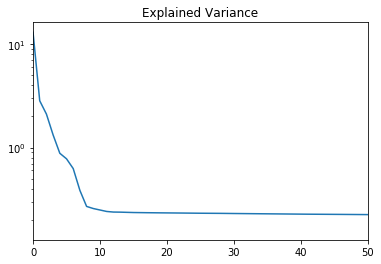

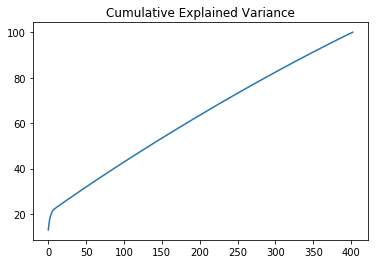

In [27]:
total = np.sum(s)
var_explained = [(i / total)*100 for i in sorted(s, reverse=True)]
cum_var_explained = np.cumsum(var_explained)
plt.plot(var_explained)
plt.title('Explained Variance')
plt.yscale('log')
plt.xlim((0,50))
plt.show()
plt.plot(cum_var_explained)
plt.title('Cumulative Explained Variance')
plt.show()

In [28]:
U = np.dot(Q, u)
print('U shape: ', U.shape) #(7499, 403)

U shape:  (7499, 403)


In [29]:
rank = 403 
u_left = u[:rank, :]
print('u_left shape: ', u_left.shape)
s_singularVals = np.matrix(linalg.diagsvd(s[:rank], rank,rank))
print('s_singularVals shape: ', s_singularVals.shape)
v_right = v[:rank, :]
print('v_right shape: ',v_right.shape)
A_ = np.asarray(u_left*s_singularVals*v_right) 
print('A_ shape: ', A_.shape) 

u_left shape:  (403, 403)
s_singularVals shape:  (403, 403)
v_right shape:  (403, 3708)
A_ shape:  (403, 3708)


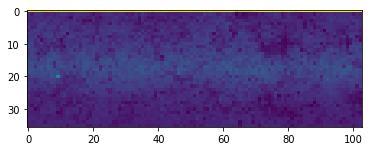

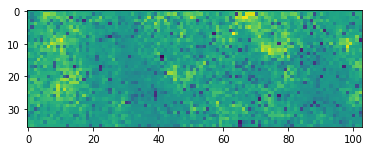

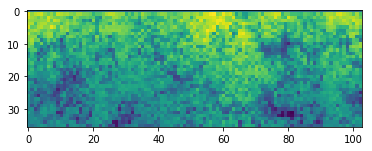

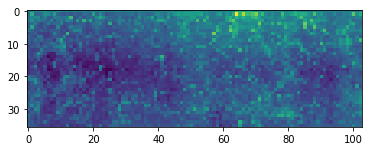

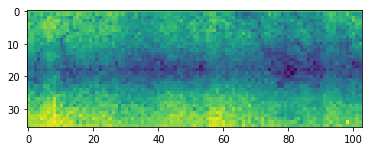

...

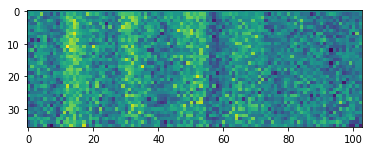

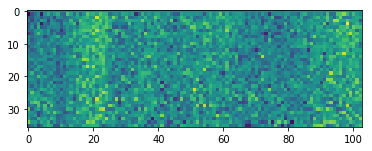

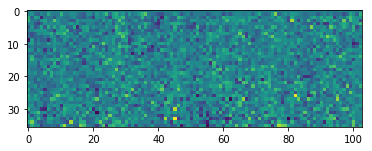

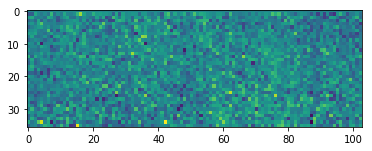

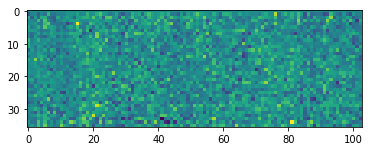

In [30]:
#Plotting 
for i in range(1,15):
    plt.imshow(-v[i, :].reshape(36, 103))
    plt.show()

# ICA variables

In [89]:
k_eig_vecs = np.asarray(k_eig_vecs)
print(k_eig_vecs.shape) #(403, 3708)
p = np.dot(X_std, k_eig_vecs.T) #p = np.dot(k_eig_vecs, X_std.T).T #p = np.dot(k_eig_vecs, X_std.T) 
print(p.shape) #(7499, 403)

(403, 3708)


ValueError: shapes (7499,10260) and (3708,403) not aligned: 10260 (dim 1) != 3708 (dim 0)

# ICA Test 0 without whitening on rm (Paper Implementation)
# A Tutorial on Independent Component Analysis: Jonathon Shlens

In [127]:
#Standardizing original matrix
ims_std_0 = StandardScaler().fit_transform(rm)
mean_vec_0 = np.mean(ims_std_0, axis=0)
print(ims_std_0.shape) #(7499, 3708)

#Covariance of original matrix
cov_0 = np.cov(ims_std_0.T)
print(cov_0.shape) #(3708, 3708)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype uint16 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


(7499, 23040)
(23040, 23040)


In [ ]:
#Finding Eigenvalues and Eigenvectors of original matrix
eig_vals_0, eig_vecs_0 = np.linalg.eig(cov_0)
print(eig_vals_0.shape) #(3708,)
print(eig_vecs_0.shape) #(3708, 3708)

In [92]:
# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs_0 = [(np.abs(eig_vals_0[i]), eig_vecs_0[:,i]) for i in range(len(eig_vals_0))]
# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs_0.sort()
eig_pairs_0.reverse()

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [35]:
eig_vals_sum_0=0.0
for i in eig_pairs_0:
    eig_vals_sum_0+=i[0]

In [36]:
total_0= 0.0
threshold_val_0 = 0.75
k_dim_subspace_0 = 0
k_eig_vecs_0 = []
k_eig_vals_0 = []
for i in eig_pairs_0:
    total_0 += i[0]
    if total_0/eig_vals_sum_0 > threshold_val_0:
        break
    else: 
        k_dim_subspace_0 += 1
        k_eig_vecs_0.append(i[1])
        k_eig_vals_0.append(i[0])
print('k_dim_subspace_0: ', k_dim_subspace_0)
print('k_eig_vecs length_0: ',len(k_eig_vecs_0) )
print('eig_pairs_0 length: ', len(eig_pairs_0))
print('k_eig_vecs_0 shape', np.asarray(k_eig_vecs_0).shape)
print('k_eig_vals_0 length', len(k_eig_vals_0))
k_eig_vecs_10 = np.asarray(k_eig_vecs_0[:150])
k_eig_vals_10 = k_eig_vals_0[:150]
print('k_eig_vals_10 length', len(k_eig_vals_10))
print('k_eig_vecs_10 shape', k_eig_vecs_10.shape)

k_dim_subspace_0:  403
k_eig_vecs length_0:  403
eig_pairs_0 length:  3708
k_eig_vecs_0 shape (403, 3708)
k_eig_vals_0 length 403
k_eig_vals_10 length 150
k_eig_vecs_10 shape (150, 3708)


In [37]:
#diagonal matrix with the square root of the associated eigenvalues
D_0 = np.diag(k_eig_vals_10) #Diagonal matrix
print(D_0.shape) #(403, 403)
E_0 = np.asarray(k_eig_vecs_10) 
print(E_0.shape) #(403, 3708)
D_0_inv = np.sqrt( np.linalg.inv(D_0) )
print(D_0_inv.shape) #(403, 403)

(150, 150)
(150, 3708)
(150, 150)


In [38]:
#whitened matrix
whitened_mat_0 = np.dot(np.dot(D_0_inv, E_0), rm.T)

(150, 7499)


In [39]:
whitened_mat_0_T = whitened_mat_0.T
print(whitened_mat_0_T.shape) #(7499, 403)

(7499, 150)


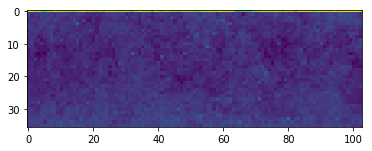

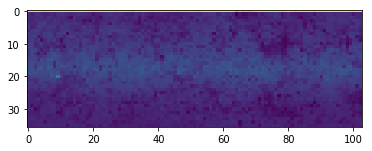

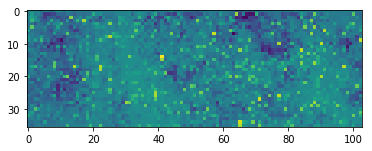

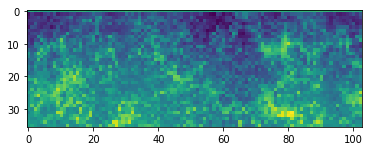

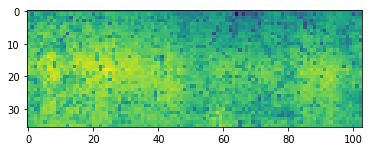

...

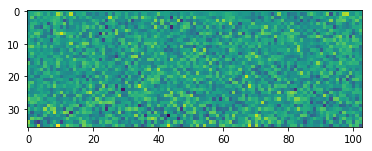

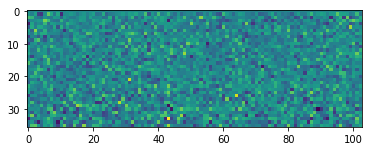

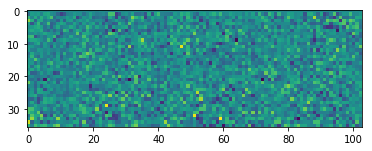

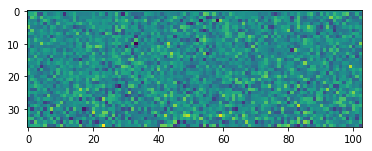

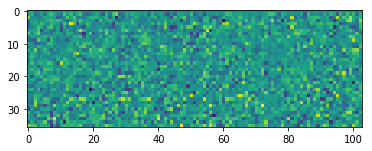

In [40]:
for i in range(150):
    plt.imshow(E_0[i, :].reshape(36, 103))
    plt.show() 

In [41]:
d_0 = 150
[V_0,s_0,u_0] = np.linalg.svd( (np.dot(np.dot(np.matlib.repmat(np.sum(whitened_mat_0 * whitened_mat_0,1), d_0, 1) , whitened_mat_0), whitened_mat_0.T)))
print(V_0.shape) #(200, 200)
print(s_0.shape) #(200,)
print(u_0.shape) #(10000, 10000)

(150, 150)
(150,)
(150, 150)


In [42]:
W_0 = np.dot((V_0 * D_0_inv), E_0)
print(W_0.shape)

(150, 3708)


In [43]:
#Recover the original sources
S_0 = W_0 * E_0
print(S_0.shape)

(150, 3708)


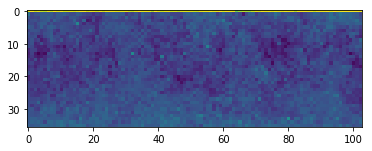

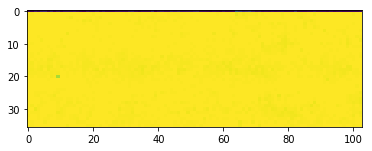

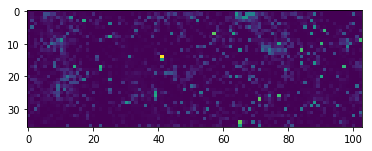

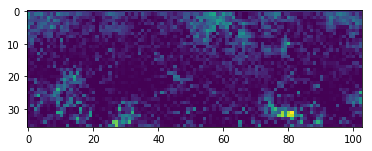

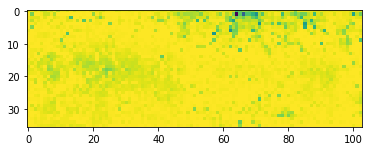

...

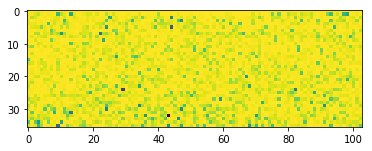

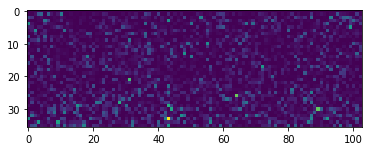

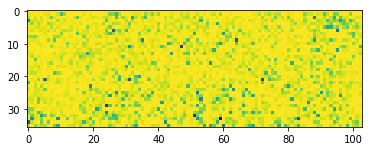

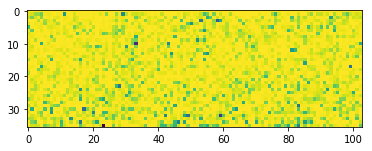

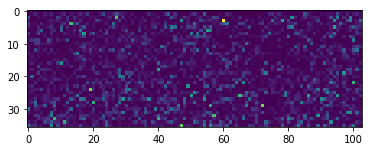

In [44]:
for i in range(150):
    plt.imshow(S_0[i].reshape(36, 103))
    plt.show() 
    

#Generate a (n * n) rotational matrix
def generate_nd_rotation_mat():
    

V_rot = scipy.optimize.minimize(entropy, np.dot(V_rot,whitened_mat_0),
                                constraints = cons, jac = False, method = 'SLSQP')

# ICA Test 1 on 'flattened_resized_movie'

In [11]:
ims_flat = flattened_resized_movie #.astype('float64')
print(ims_flat.shape) #(7499, 3708)

#Standardizing original matrix
ims_std_1 = StandardScaler().fit_transform(ims_flat) #(7499, 3708)
print(ims_std_1.shape) #(7499, 3708)

#Covariance of original matrix
cov_1 = np.cov(ims_std_1.T)
print(cov_1.shape) #(3708, 3708)

(7499, 23040)


/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype uint16 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


(7499, 23040)
(23040, 23040)


In [12]:
#Finding Eigenvalues and Eigenvectors of original matrix
eig_vals_1, eig_vecs_1 = np.linalg.eigh(cov_1)
print(eig_vals_1.shape) #(3708,)
print(eig_vecs_1.shape) #(3708, 3708)

(23040,)
(23040, 23040)


#save the time consuming computing time by saving the matrix
np.save('eigenValues', eig_vals_1)
np.save('eigenVectors', eig_vecs_1)


In [5]:
#load the saved array
#a = np.load('eigenValues.npy')
#b = np.load('eigenVectors.npy')

In [4]:
idx = eig_vals_1.argsort()[::-1]   
eigenValues = eig_vals_1[idx]
eigenVectors = eig_vecs_1[:, idx]

NameError: name 'eig_vals_1' is not defined

In [25]:
# k = no. of eigenvectors to choose
k = 25

In [26]:
#choose k eigen vectors and eigen values
k_eigenValues = eigenValues[:k]  #(k,)
print(k_eigenValues.shape)
k_eigenVectors = eigenVectors[:, :k] #(3708, k)
print(k_eigenVectors.shape)

(25,)
(23040, 25)


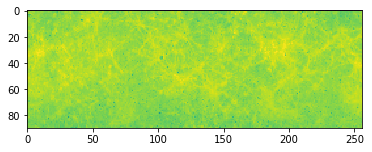

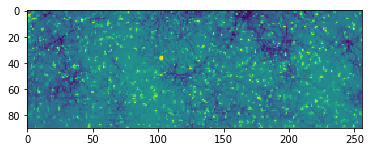

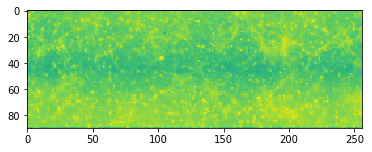

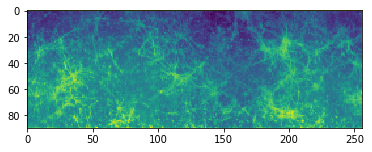

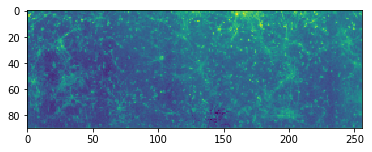

...

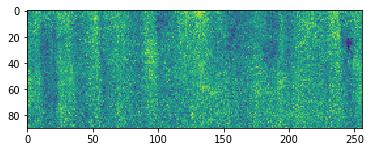

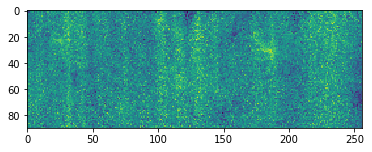

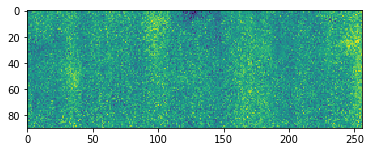

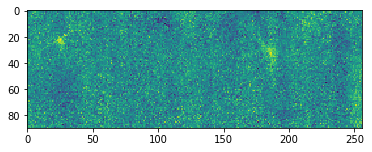

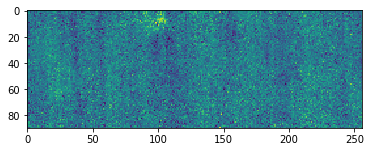

In [27]:
for i in range(k):
    plt.imshow(k_eigenVectors[:, i].reshape((pix_x, pix_y)))
    plt.show() 

In [28]:
pca_data = np.dot(ims_std_1, k_eigenVectors)
print(pca_data.shape) #(7499, k)

(7499, 25)


In [29]:
from sklearn.decomposition import FastICA, PCA
ica = FastICA(n_components = k, max_iter = 4000, tol = 0.5)
S_1 = ica.fit_transform(pca_data)  # Reconstruct signals
A_1 = ica.mixing_  # Get estimated mixing matrix

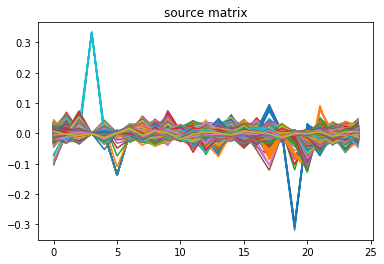

In [30]:
data_S = np.array(S_1) 
plt.plot(np.arange(k), data_S.transpose())
plt.title('source matrix')
plt.show()

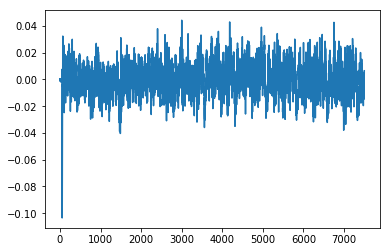

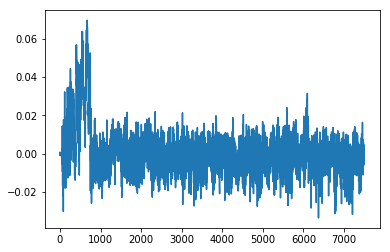

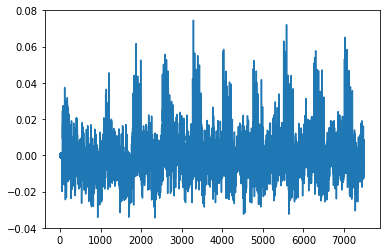

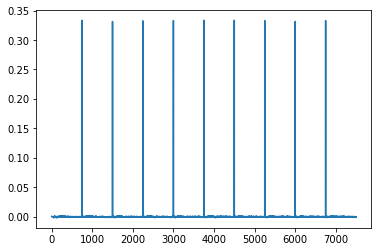

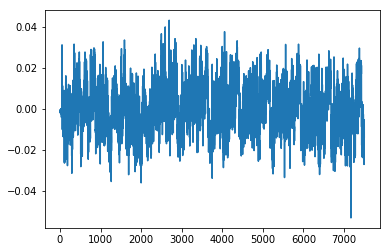

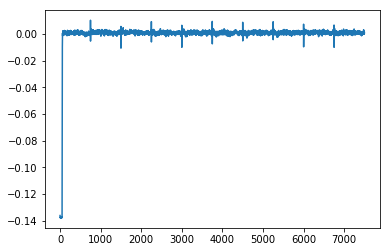

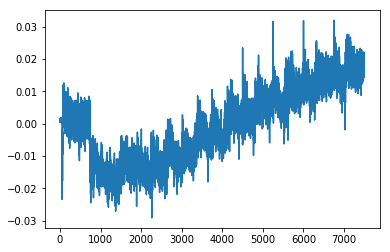

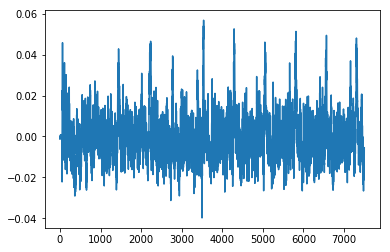

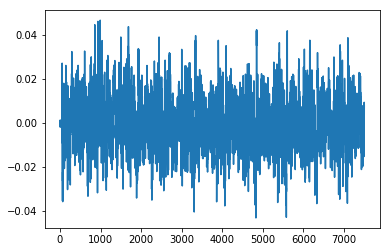

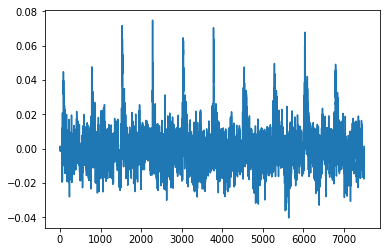

In [31]:
for i in range(10):
    plt.plot(S_1[:,i])
    plt.show()

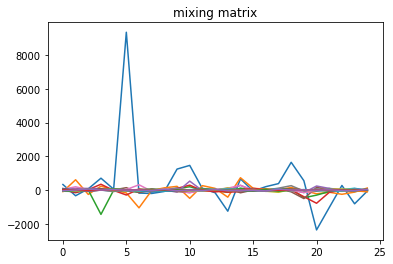

In [32]:
data_A = np.array(A_1) 
plt.plot(np.arange(k), data_A.transpose())
plt.title('mixing matrix')
plt.show()

In [33]:
print(S_1.shape) #(7499, k)
print(A_1.shape) #(k, k)

(7499, 25)
(25, 25)


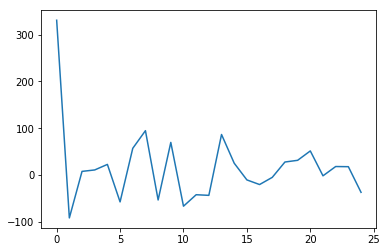

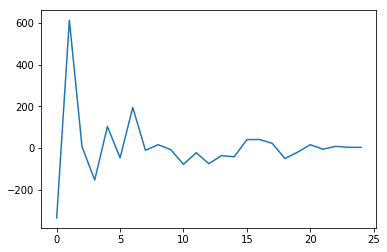

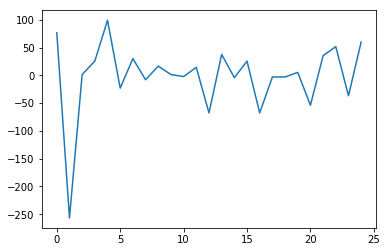

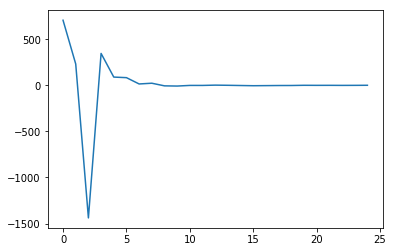

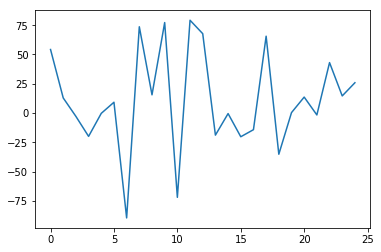

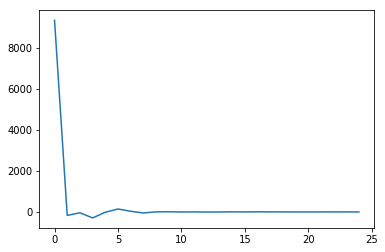

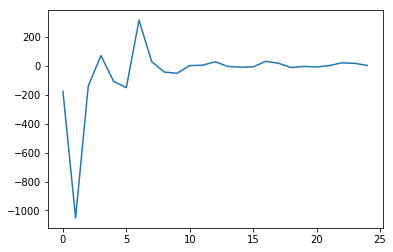

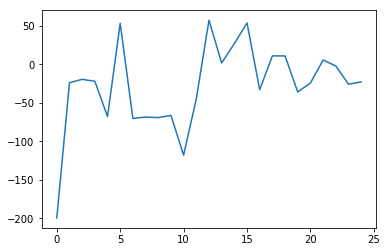

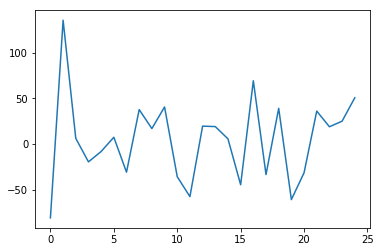

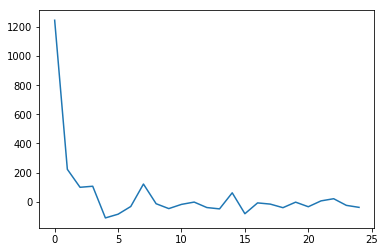

In [34]:
for i in range(10):
    plt.plot(A_1[:,i])
    plt.show()


In [35]:
W_1 = np.linalg.inv(A_1) #unmixing matrix
print(W_1.shape) #(k, k)

(25, 25)


In [36]:
lc_1 = np.dot(W_1,k_eigenVectors.T) #Linear combinations
print(lc_1.shape) #(k, 3708)

(25, 23040)


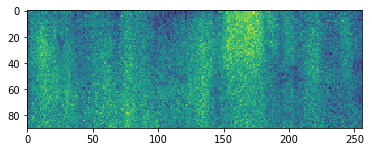

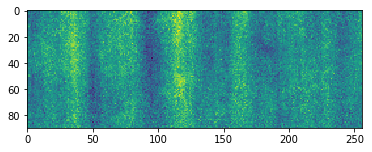

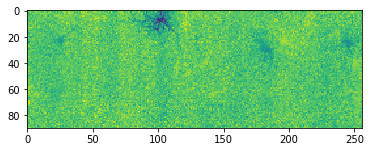

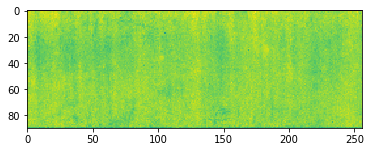

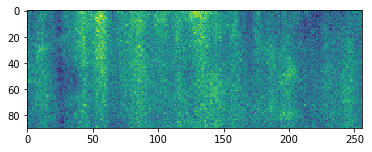

...

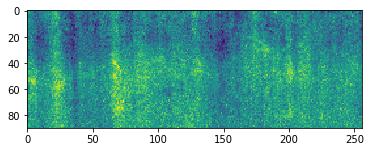

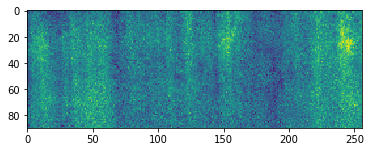

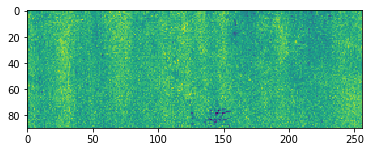

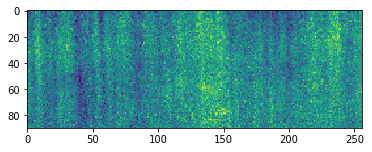

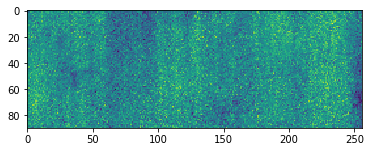

In [37]:
for i in range(k):
    plt.imshow(-lc_1[i,:].reshape((pix_x, pix_y)))
    plt.show() 

In [1]:
plt.imshow(lc_1[2,:].reshape((pix_x, pix_y)))
plt.show()
plt.imshow(-lc_1[12,:].reshape((pix_x, pix_y)))
plt.show()
plt.imshow(lc_1[22,:].reshape((pix_x, pix_y)))
plt.show()

NameError: name 'plt' is not defined

In [39]:
#diagonal matrix with the square root of the associated eigenvalues
D_1 = np.diag(k_eigenValues) #Diagonal matrix
print(D_1.shape) #(k, k)
E_1 = np.asarray(k_eigenVectors) 
print(E_1.shape) #(3708, k)

D_1_inv = np.sqrt( np.linalg.inv(D_1) )
print(D_1_inv.shape) #(k, k)

(25, 25)
(23040, 25)
(25, 25)


In [40]:
#whitened matrix
whitened_mat_1 = np.dot(np.dot(D_1_inv, E_1.T), ims_std_1.T)
print(whitened_mat_1.shape) #(k, 7499)

(25, 7499)


In [41]:
whitened_mat_1_T = whitened_mat_1.T
print(whitened_mat_1_T.shape) #(7499, k)

(7499, 25)


In [42]:
from sklearn.decomposition import FastICA, PCA
ica_2 = FastICA(n_components = k, max_iter = 4000, tol = 0.3)
S_2 = ica_2.fit_transform(whitened_mat_1_T)  # Reconstruct signals
A_2 = ica_2.mixing_  # Get estimated mixing matrix

In [43]:
print(S_2.shape) #(7499, k)
print(A_2.shape) #(k, k)

(7499, 25)
(25, 25)


In [44]:
W_2 = np.linalg.inv(A_2) #unmixing matrix
print(W_2.shape) #(k, k)

(25, 25)


In [45]:
lc_2 = np.dot(W_2,k_eigenVectors.T) #Linear combinations
print(lc_2.shape) #(k, 3708)

(25, 23040)


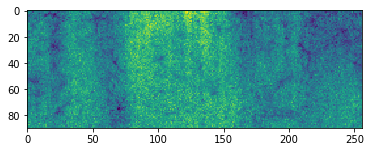

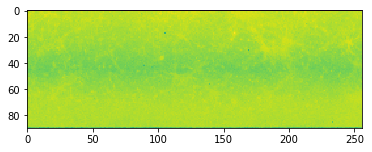

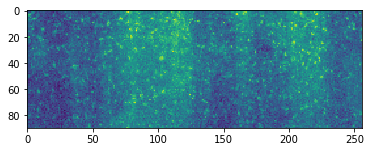

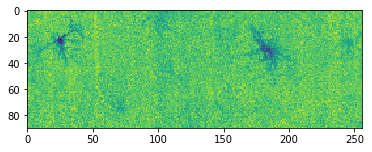

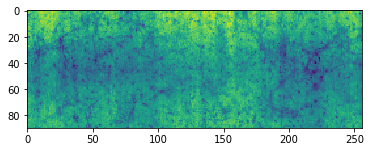

...

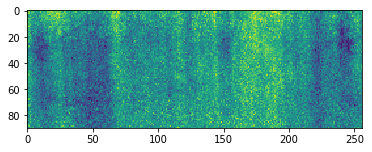

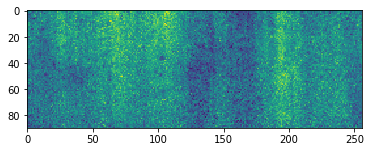

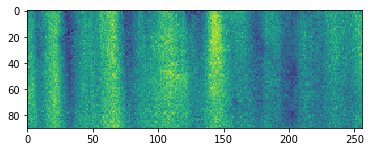

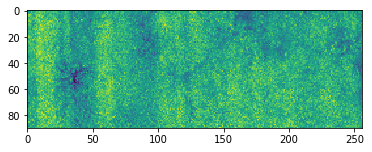

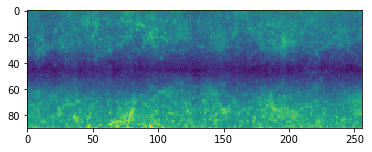

In [46]:
for i in range(k):
    plt.imshow(lc_2[i,:].reshape((pix_x, pix_y)))
    plt.show() 

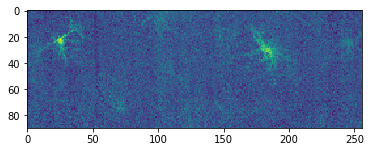

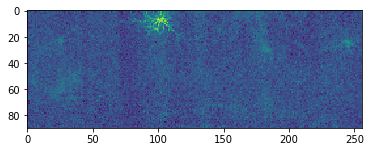

In [53]:
plt.imshow(-lc_2[3,:].reshape((pix_x, pix_y)))
plt.show()
plt.imshow(lc_2[12,:].reshape((pix_x, pix_y)))
plt.show()
plt.show()
plt.imshow

# Localization

**1st step**: Apply PCA for dimensionality reduction (done).<br>
PCA alone cannot isolate signals from individual neurons. 
Each Principal component has a mix of signals from multiple neurons.<br>
**To find**: A set of signal sources reflecting individual neurons. Such sources should be **localized**.<br>

**2nd step**: Apply ICA to yield individual neurons. <br>
Sort independent components by **temporal skewness**.<br>
**To Find**: **Spatial skewness**, Temporal skewness